In [13]:
import h5py
import os
import numpy as np
import umap
import hdbscan
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import pickle
import sklearn.cluster as cluster


In [14]:
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import fetch_openml
from sklearn.decomposition import PCA
from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score

from scipy.stats import linregress
from scipy.optimize import curve_fit

In [15]:
from moviepy.editor import *

In [16]:
filenames =[
"./C1_R1v2_ID1v2.mp4.predictions.000_C1_R1v2_ID1v2.analysis_fixed.h5",
"./C1_R1v4_ID1v3.mp4.predictions.000_C1_R1v4_ID1v3.analysis_fixed.h5",
"./C2_R1v2_ID1v3.mp4.predictions.000_C2_R1v2_ID1v3.analysis_fixed.h5",
"./C2_R4v1_ID4v1.mp4.predictions.000_C2_R4v1_ID4v1.analysis_fixed.h5",
"./C3_R2v1_ID3v4.mp4.predictions.000_C3_R2v1_ID3v4.analysis_fixed.h5",
"./C3_R1v4_ID4v1.mp4.predictions.000_C3_R1v4_ID4v1.analysis_fixed.h5",
'./C4_R2v1_ID3v2.mp4.predictions.000_C4_R2v1_ID3v2.analysis_fixed.h5',
"./C4_R1v4_ID2v4.mp4.predictions.000_C4_R1v4_ID2v4.analysis_fixed.h5",
"./C5_R2v1_ID2v4.mp4.predictions.000_C5_R2v1_ID2v4.analysis_fixed.h5",
"./C5_R4v1_ID3v4.mp4.predictions.000_C5_R4v1_ID3v4.analysis_fixed.h5",
"./C6_R1v2_ID1v3.mp4.predictions.slp.000_C6_R1v2_ID1v3.analysis_fixed.h5",
"./C6_R4v1_ID4v1.mp4.predictions.000_C6_R4v1_ID4v1.analysis_fixed.h5"
]

def get_info(filename):
    with h5py.File(filename, "r") as f:
        dset_names = list(f.keys())
        locations = f["tracks"][:].T
        node_names = [n.decode() for n in f["node_names"][:]]
    return dset_names, locations, node_names

In [17]:
from scipy.interpolate import interp1d

def fill_missing(Y, kind="linear"):
    """Fills missing values independently along each dimension after the first."""

    # Store initial shape.
    initial_shape = Y.shape

    # Flatten after first dim.
    Y = Y.reshape((initial_shape[0], -1))

    # Interpolate along each slice.
    for i in range(Y.shape[-1]):
        y = Y[:, i]

        # Build interpolant.
        x = np.flatnonzero(~np.isnan(y))
        f = interp1d(x, y[x], kind=kind, fill_value=np.nan, bounds_error=False)

        # Fill missing
        xq = np.flatnonzero(np.isnan(y))
        y[xq] = f(xq)
        
        # Fill leading or trailing NaNs with the nearest non-NaN values
        mask = np.isnan(y)
        y[mask] = np.interp(np.flatnonzero(mask), np.flatnonzero(~mask), y[~mask])

        # Save slice
        Y[:, i] = y

    # Restore to initial shape.
    Y = Y.reshape(initial_shape)

    return Y

In [18]:
def combine_locations(filenames):
    """
    takes in a list a filenames for h5 files that
    you want to concatenate along the frame dimension
    """
    loc_check = []
    is_first = True
    for filename in filenames:
        dset_names, locations, node_names = get_info(filename)
        loc_check.append(locations.shape[0])
        locations = fill_missing(locations)
        if is_first:
            # First array becomes the thing we append to below
            # we don't know the shape ahead of time so this works okay.
            locations_master = locations
            is_first = False
        else:
            locations_master = np.concatenate((locations_master, locations),0)
    return locations_master

In [19]:
loc_master = combine_locations(filenames)

    # %%
loc_master.shape
    #frames, nodes, coordinates, mice

    # %%


    #loc_test looks frames in 1D and then iterates through each node, through each mouse, through each coordinat


(4897, 6, 2, 2)

In [20]:
loc_test = np.reshape(loc_master, (4897, 24), order = 'C')
loc_test.shape

(4897, 24)

In [21]:
reducer = umap.UMAP()
# dimenionality reduction part of UMAP ( uniform manifold approximation & projection )

standard_embedding = reducer.fit_transform(loc_test)

# by default UMAP reduces to 2D 
# goal shape should be # of ( frames , 2 )


In [22]:
def combine_videos(folder, output_video_name):
    '''
    combines all files within a given folder name 
    creates a video file called vidname
    folder (str) , vidname (str) 
    '''
    path = os.fsencode(os.path.join(".", folder))
    clips = []
    for file in os.listdir(path):
        filename = os.path.join(folder, os.fsdecode(file))
        clip = VideoFileClip(filename)
        clips.append(clip.without_audio())
    final = concatenate_videoclips(clips)
    final.write_videofile(output_video_name)

In [23]:
combine_videos("videos", "final_final.mp4")


Moviepy - Building video final_final.mp4.
Moviepy - Writing video final_final.mp4



t:  58%|█████▊    | 2848/4899 [01:12<00:48, 42.24it/s, now=None]

KeyboardInterrupt: 

In [ ]:
final_vid = VideoFileClip("final_final.mp4")
n_frames = final_vid.reader.nframes
n_frames
# why are there three extra frames !! GAH 

4900

In [24]:
clusterable_embedding = umap.UMAP(
    n_neighbors=30,
    min_dist=0.0,
    n_components=2,
    random_state=42,
).fit_transform(loc_test)

clusterable_embedding.shape

# n_neighbors: we want a large n_neighbors value
# small values focus more on local structure
# more prone to producing fine grained cluster structure from patterns of noise in the data than actual clusters.
# In this case we’ll double it from the default 15 up to 30.

# min_dist: very low
# bc we actually want to pack points together densely 
# a low value increase separations between clusters

# what is random_state ? 
# what is n_components? 



t:  58%|█████▊    | 2852/4899 [01:27<00:48, 42.24it/s, now=None]

(4897, 2)

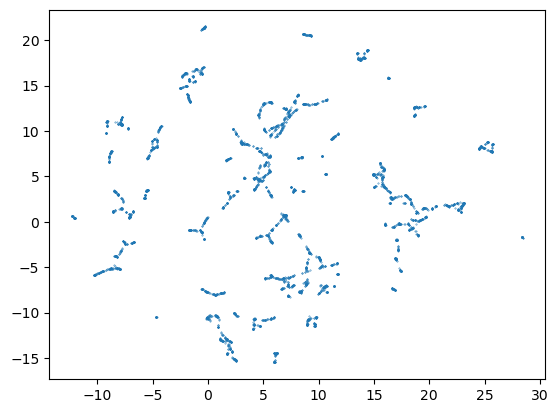

In [25]:
plt.scatter(standard_embedding[:, 0], standard_embedding[:, 1], s=0.1,);

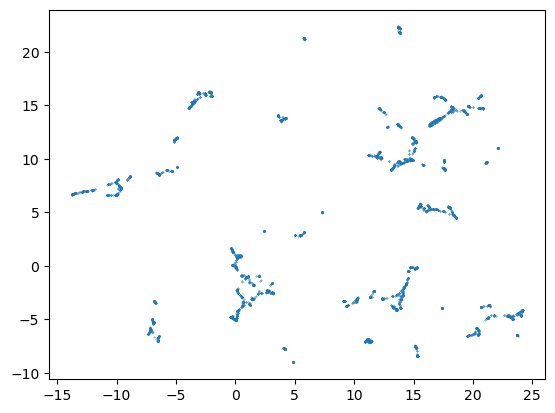

In [26]:
plt.scatter(clusterable_embedding[:, 0], clusterable_embedding[:, 1], s=0.1);

In [28]:
hdbscan_labels = hdbscan.HDBSCAN(min_samples=10, min_cluster_size=500).fit_predict(clusterable_embedding)
print(hdbscan_labels[4896])
print(hdbscan_labels[3])
print(hdbscan_labels[560])


print(np.unique(hdbscan_labels))
print(type(hdbscan_labels))
print(len(hdbscan_labels))

#print(hdbscan_labels[clustered])

3
3
1
[-1  0  1  2  3]
<class 'numpy.ndarray'>
4897


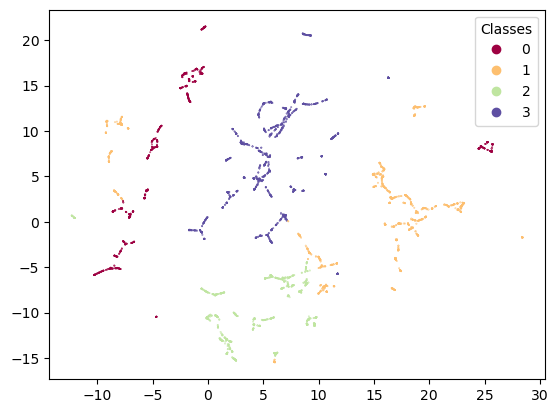

In [58]:
clustered = (hdbscan_labels >= 0)
fig, ax = plt.subplots()

# plt.scatter(standard_embedding[~clustered, 0],
#             standard_embedding[~clustered, 1],
#             color=(0.5, 0.5, 0.5),
#             s=0.1,
#             alpha=0.5)
scatter = plt.scatter(standard_embedding[clustered, 0],
            standard_embedding[clustered, 1],
            c=hdbscan_labels[clustered],
            s=0.1,
            cmap='Spectral')

plt.legend(*scatter.legend_elements(),  title="Classes")
plt.show()

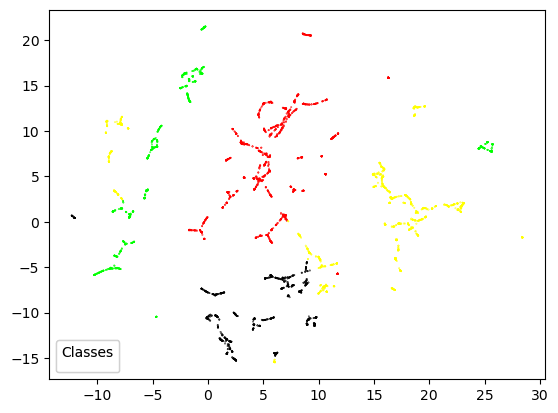

In [53]:
clustered = (hdbscan_labels >= 0)
fig, ax = plt.subplots()

# plt.scatter(standard_embedding[~clustered, 0],
#             standard_embedding[~clustered, 1],
#             color=(0.5, 0.5, 0.5),
#             s=0.1,
#             alpha=0.5)
my_colors = {
    1: '#FFFF00',
    #yellow
    2: '#000000',
    #black
    3: '#ff0000',
    #red
    0: '#00ff00'
    #green
}
colors = [my_colors[value] for value in hdbscan_labels[clustered] ]
scatter = ax.scatter(standard_embedding[clustered, 0],
            standard_embedding[clustered, 1],
            c=colors,
            s=0.1)

legend = ax.legend(*scatter.legend_elements(),
                    loc="lower left", title="Classes")

ax.add_artist(legend)
plt.show()


([], [])

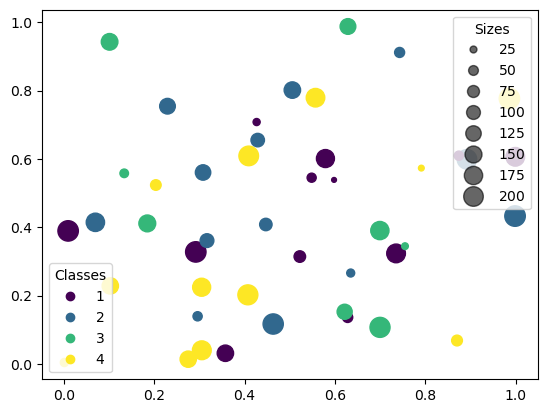

In [55]:
N = 45
x, y = np.random.rand(2, N)
c = np.random.randint(1, 5, size=N)
s = np.random.randint(10, 220, size=N)

fig, ax = plt.subplots()

scatter = ax.scatter(x, y, c=c, s=s)

# produce a legend with the unique colors from the scatter
legend1 = ax.legend(*scatter.legend_elements(),
                    loc="lower left", title="Classes")
ax.add_artist(legend1)

# produce a legend with a cross section of sizes from the scatter
handles, labels = scatter.legend_elements(prop="sizes", alpha=0.6)
legend2 = ax.legend(handles, labels, loc="upper right", title="Sizes")

plt.show()

In [56]:
scatter.legend_elements()


([<matplotlib.lines.Line2D at 0x22d81aeabe0>,
 ['$\\mathdefault{1}$',
  '$\\mathdefault{2}$',
  '$\\mathdefault{3}$',
  '$\\mathdefault{4}$'])

In [ ]:
# i want to make a dictionary
# where each key (cluster) has a value (list of indices)
def cluster_dic(labels):
    """
    takes in a list of labels (hdbscan labels)
    and returns a dictionary {cluster:[list of frames]}
    """
    clusters = {}
    print(labels)
    # if a cluster key already exists in the dictionary, append its value (list) with the new frame (i)
    for i in range(len(labels)):
        if labels[i] in clusters:
            temp_val = clusters[labels[i]]
            temp_val.append(i)
            clusters[labels[i]] = temp_val
        #if the cluser does not have a unique key yet, create one, who 
        else:
            clusters[labels[i]] = [i]
    return clusters

cluster_dict = cluster_dic(hdbscan_labels)

[3 3 3 ... 3 3 3]
new key!
new key!
new key!
new key!
new key!


In [ ]:
for key in cluster_dic: 
    images_list = cluster_dic[key].value()
    cluster_video = ImageSequenceClip(images_list, fps = 30)



[1, 2, 3]

In [ ]:
import moviepy.editor as mpy

def make_clip(list_of_frames, video):
    frames = []
    for frame in list_of_frames:
        frames.append(video.get_frame(frame/30))

    clip = mpy.ImageSequenceClip(frames, fps=30)
    return clip

small_example = cluster_dict[1]
make_clip(small_example, final_vid).ipython_display(width = 480)


Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4
